# Introduction

The idea of this notebook is to analyze the behavior of the variables to be controlled in the priority control loops of the iodide plant, the variables to be controlled are:

- Cooling tower tank level cotadura (LIT -001)
- Cooling tower level stripping (LIT-002)
- Stripping tank level (LIT-011)
- Iodide tank level (LIT007)
- Cooling tower inlet temperature (TIT-009)
- Organic flow /aqueous flow ratio

A flowsheet of the iodide process is shown in the portfolio pdf document, and the information on the controlled and manipulated variables of the control loops.

# Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objs as go

# Data loading

In [2]:
# The data used comes from sensor data with a frequency of 1 minute during the month of April 2024
df=pd.read_excel('sensor_data.xlsx', sheet_name='Total')

# Data Cleaning and Processing

In [3]:
# The columns are renamed, since they come with the name of the tag, to make the analysis easier
new_names = {
    'TimeStamp':'Timestamp',
    '.[YODURO:RSLinx Enterprise:YODURO_3.A6680FIT009.Val]': "Adjustment flow",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680FIT018.Val]':"Iodide flow",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680FIT015.Val]':"Brine flow to tower",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680FIT016.Val]':"Brine flow to reactor",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680LIT007.Val]':"Iodide tank level",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680LIT001.Val]':"Cooling tower tank level cotadura",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680LIT002.Val]':"Cooling tower level stripping",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680LIT011.Val]':"Stripping tank level",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6680TIT009.Val]':"Cooling tower inlet temperature",
       '.[YODURO:RSLinx Enterprise:YODURO_3.A6659FIT032.Val]':"Kerosene recirculation flow",
        '.[YODURO:RSLinx Enterprise:YODURO_3.A6680FIT011.Val]':"Caustic soda flow",
        '.[YODURO:RSLinx Enterprise:YODURO_1.A6501FIT1135.Val]':'AFO flow'}

df=df.rename(columns=new_names)

In [4]:
# We check how the dataframe is now
df.head(3)

,Timestamp,Adjustment flow,Iodide flow,Brine flow to tower,Brine flow to reactor,Iodide tank level,Cooling tower tank level cotadura,Cooling tower level stripping,Stripping tank level,Cooling tower inlet temperature,Kerosene recirculation flow,Caustic soda flow,AFO flow
0,2024-04-01 12:00:00,18.803492,132.652786,145.525894,727.291260,50.058979,86.288872,80.731308,80.473816,401.403748,227.497025,168.705093,0.250187
1,2024-04-01 12:01:00,18.827620,131.712479,145.338486,719.304321,48.713375,86.057930,80.459496,81.155624,404.884521,220.357925,169.958054,0.250813
2,2024-04-01 12:02:00,18.751324,130.524841,145.403809,720.033813,47.681152,85.514572,80.139236,81.831024,404.236816,211.319672,152.370316,0.251439


In [5]:
# The caustic soda flow is in l/h, we convert it to m3/h
df['Caustic soda flow']=df['Caustic soda flow']/1000

In [6]:
# The variable of the ratio between organic flow and aqueous flow is created
df['O/A']=df["Kerosene recirculation flow"]/(df['Adjustment flow']+df['Iodide flow']+df['Brine flow to reactor'])

In [7]:
# We verify that the data is in the correct format, the process variables as numeric data and the date as datetime
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40320 entries, 0 to 40319
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Timestamp                          40320 non-null  datetime64[ns]
 1   Adjustment flow                    40320 non-null  float64       
 2   Iodide flow                        40320 non-null  float64       
 3   Brine flow to tower                40320 non-null  float64       
 4   Brine flow to reactor              40320 non-null  float64       
 5   Iodide tank level                  40320 non-null  float64       
 6   Cooling tower tank level cotadura  40320 non-null  float64       
 7   Cooling tower level stripping      40320 non-null  float64       
 8   Stripping tank level               40320 non-null  float64       
 9   Cooling tower inlet temperature    40320 non-null  float64       
 10  Kerosene recirculation flow       

## Plant stoppage identification

Plant stoppages are identified to eliminate the data that is in that time interval. We identify the plant stoppage when there is a drop in the flow of brine to the reactor, since it is the main flow used in the plant, which implies whether the plant is in service or not.

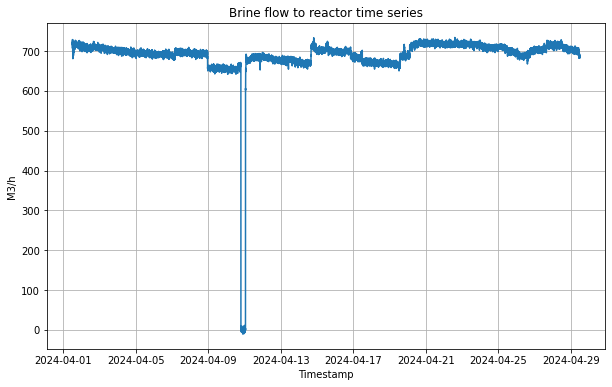

In [8]:
# The trend is plotted as a time series
plt.figure(figsize=(10, 6))
variable='Brine flow to reactor'
plt.plot(df['Timestamp'], df[variable])

# Graph configuration
plt.xlabel('Timestamp')
plt.ylabel('M3/h')
plt.title(f'{variable} time series')
plt.grid(True)

plt.show()

The above graph is for reference, now we need a graph to zoom in on the plant downtime period

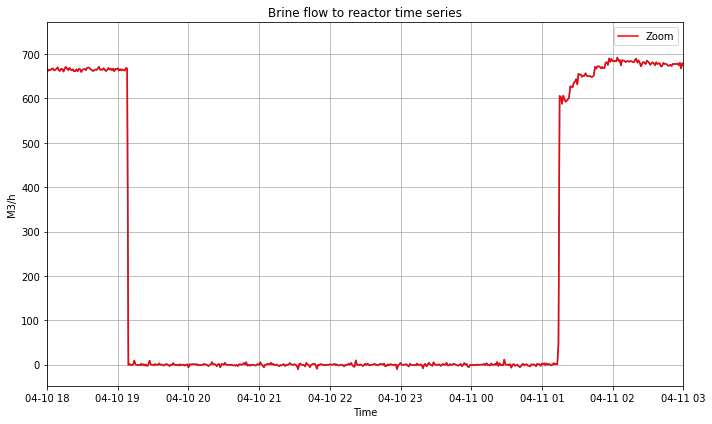

In [9]:
# Define the date range to zoom in
start_date = '2024-04-10 18:00:00'
end_date = '2024-04-11 03:00:00'

# Filter the DataFrame to include only the selected date range
df_zoom = df[(df['Timestamp'] >= start_date) & (df['Timestamp'] <= end_date)]

# The variable is graphed in the specified date range
plt.figure(figsize=(10, 6))
plt.plot(df['Timestamp'], df[variable])
plt.plot(df_zoom['Timestamp'], df_zoom[variable], label='Zoom', color='red')

# Graph configuration
plt.xlabel('Time')
plt.ylabel('M3/h')
plt.title(f'{variable} time series')
plt.legend()
plt.grid(True)

# Set x and y axis limits for zoom
plt.xlim(pd.to_datetime(start_date), pd.to_datetime(end_date))

# Show the graph
plt.tight_layout()
plt.show()

It is seen that there is a period in which the plant stopped, we proceed to eliminate this data so that it does not interfere with the analysis.

In [10]:
start_date = pd.to_datetime('2024-04-10 18:00:00')
end_date = pd.to_datetime('2024-04-11 03:00:00')

df_filtered= df[(df['Timestamp'] < start_date) | (df['Timestamp'] > end_date)]

# Analysis and results

Now that we have the data when the plant was in service, we perform the analysis.

## Analysis of variables that were already in a control loop

The statistical parameters of the mean and standard deviation are obtained for the variables that already had a control loop before April.

In [11]:
df_filtered[['Cooling tower tank level cotadura','Cooling tower level stripping',
             'Cooling tower inlet temperature',"O/A"]].std()

Cooling tower tank level cotadura     1.169676
Cooling tower level stripping         4.081144
Cooling tower inlet temperature      22.339683
O/A                                   0.014912
dtype: float64

In [12]:
df_filtered[['Cooling tower tank level cotadura','Cooling tower level stripping',
             'Cooling tower inlet temperature',"O/A"]].mean()

Cooling tower tank level cotadura     70.088021
Cooling tower level stripping         76.717229
Cooling tower inlet temperature      436.443507
O/A                                    0.320187
dtype: float64

In general, a low variability is seen (<5), except for the controlled variable of Cooling tower inlet temperature, more work must be done on the PID parameters to better tune the loop.

## Variable analysis with newly implemented control loops (04/18/24)

Now two variables are being analyzed that began to function with control loops since April 18.

In [13]:
start_date = pd.to_datetime('2024-04-18 12:00:00')

df_new_loops= df_filtered[(df_filtered['Timestamp'] > start_date )]

### Stripping tank level

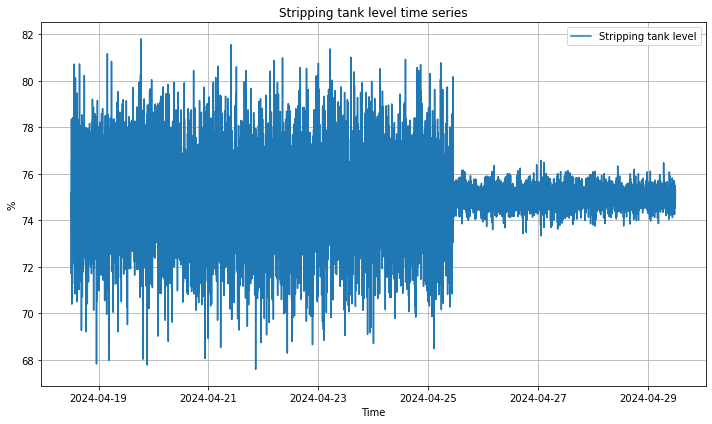

In [14]:
# The column to be graphed is selected
column1 = 'Stripping tank level'
plt.figure(figsize=(10, 6))
plt.plot(df_new_loops['Timestamp'], df_new_loops[column1], label=column1)

# Graph configuration
plt.xlabel('Time')
plt.ylabel('%')
plt.title(f'{column1} time series')
plt.legend()
plt.grid(True)

# Show the graph
plt.tight_layout()
plt.show()

It is noted that an adjustment was made to the PID control parameters, let's take the statistical parameters after the last adjustment.

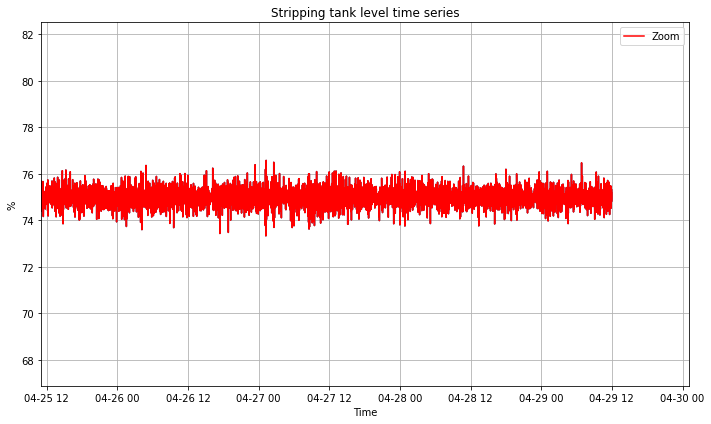

In [15]:
# Define the date range to zoom in
start_date = '2024-04-25 11:00:00'

# Filter the DataFrame to include only the selected date range
df_zoom = df_new_loops[(df_new_loops['Timestamp'] >= start_date)]

# The variable is graphed in the specified date range
plt.figure(figsize=(10, 6))
plt.plot(df_new_loops['Timestamp'], df_new_loops[column1])
plt.plot(df_zoom['Timestamp'], df_zoom[column1], label='Zoom', color='red')

# Graph configuration
plt.xlabel('Time')
plt.ylabel('%')
plt.title(f'{column1} time series')
plt.legend()
plt.grid(True)

# Set x and y axis limits for zoom
plt.xlim(pd.to_datetime(start_date))

# Show the graph
plt.tight_layout()
plt.show()

The statistical parameters of the mean and standard deviation are obtained for the "Stripping tank level" since adjustments were made to the PID parameters.

In [16]:
df_zoom['Stripping tank level'].mean()

74.99951716944115

In [17]:
df_zoom['Stripping tank level'].std()

0.34833824008990344

It is verified that with the latest adjustments to the parameters of the PID control loop, there is a low variability (<5).

### Iodide tank level

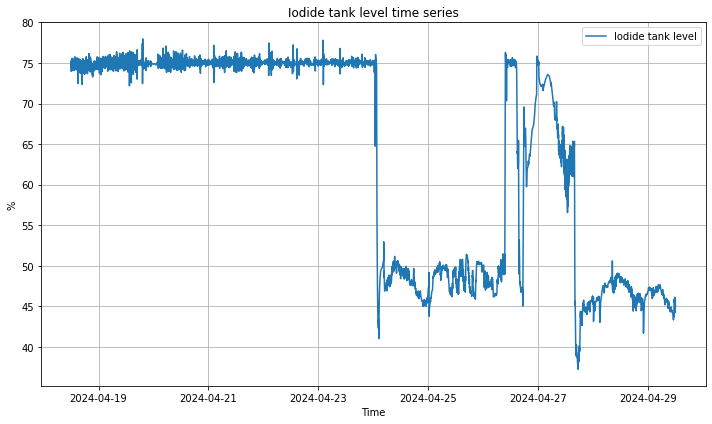

In [18]:
# The column to be graphed is selected
column1 = 'Iodide tank level'
plt.figure(figsize=(10, 6))
plt.plot(df_new_loops['Timestamp'], df_new_loops[column1], label=column1)

# Graph configuration
plt.xlabel('Time')
plt.ylabel('%')
plt.title(f'{column1} time series')
plt.legend()
plt.grid(True)

# Show the graph
plt.tight_layout()
plt.show()

It can be observed that after leaving the variable controlled with a PID control loop it was quite stable, but then the variability increased a lot. Let's investigate what the root cause was, for that we perform a balance in the tank with the inlet and outlet flows.

In [19]:
df_new_loops = df_new_loops.copy()
df_new_loops['balance'] = (
    df_new_loops['Brine flow to tower'] +
    df_new_loops['AFO flow'] +
    df_new_loops['Caustic soda flow'] -
    df_new_loops['Iodide flow']
)

In [20]:
columns = ['Iodide tank level', 'Brine flow to tower', 'Iodide flow', 'Caustic soda flow','AFO flow','balance']

traces = []
for column in columns:
    trace = go.Scatter(x=df_new_loops['Timestamp'], y=df_new_loops[column], mode='lines', name=column)
    traces.append(trace)

# Graph configuration
layout = go.Layout(
    title='Process variables',
    yaxis=dict(title='Value'),
    legend=dict(orientation='h'),
    hovermode='closest'
)

fig = go.Figure(data=traces, layout=layout)

# Show the graph
fig.show()
fig.write_html("graph_interactive.html")

Interactive Graph: 
You can view the interactive version of the graph [here](https://diegobarrientosp.github.io/Analysis-of-control-loop-improvements/graph_interactive.html).

By zooming in on the graph at the moment when the drop in the Iodide tank level began Apr 24, 2024 at 01:00, we can see that it was caused by an increase in the output flow "Iodide flow", due to production budget, more flow was needed. However, the manipulated variable, which is the input flow "Brine flow to tower", was unable to match the output flow, due to a pump capacity issue. This analysis led to a project to change the pump motor to solve this problem.

Additionally, the need arose with the control team to improve the tuning of the loop that controls the Cooling tower inlet temperature, to reduce its variability and achieve a standard deviation <5.